In [3]:
import cv2                 # working with, mainly resizing, images
import numpy as np         # dealing with arrays
import os                  # dealing with directories
from sklearn.utils import shuffle # mixing up or currently ordered data that might lead our network astray in training.
from tqdm import tqdm     # a nice pretty percentage bar for tasks. Thanks to viewer Daniel BA1/4hler for this suggestion
from sklearn.cross_validation import train_test_split #Splitting the data into Train and Test
from PIL import Image      # Converting the ImageNumpyArrayy into Image object

import matplotlib.pyplot as plt #Ploting pictures and Chart

from keras import backend as K
K.set_image_dim_ordering('th')

from keras import callbacks
from keras.utils import np_utils
from keras.models import Model 
from keras.layers import Dense, Flatten, Input, Conv2D, Conv2DTranspose, UpSampling2D, MaxPooling2D

TRAIN_DIR = 'C:/Users/PagolPoka/Desktop/Deep_Learning_Project/dataset/training_set'
NOISY_TRAIN_DIR = 'C:/Users/PagolPoka/Desktop/test_set/Noise'
TEST_DIR = 'C:/Users/PagolPoka/Desktop/Deep_Learning_Project/dataset/test_set'
IMG_SIZE = 128
LR = 1e-3
num_channel=3
num_epoch=100


Using TensorFlow backend.


In [4]:
#Fetches all the training pictures from the directory
def create_train_data():
    training_data_list = []
    labels_list = []
  
    for folder in tqdm(os.listdir(TRAIN_DIR)):
        if folder != '.DS_Store':
            Train_Path = TRAIN_DIR + '/' + folder
            #print(Train_Path)
            
            for img in tqdm(os.listdir(Train_Path)):
                labels_list.append(img) 
                path = os.path.join(Train_Path,img)
                img = cv2.imread(path,cv2.IMREAD_COLOR) #Reading the Image in color
                img = cv2.resize(img, (IMG_SIZE,IMG_SIZE)) #Resizing the Image 
                training_data_list.append(img)
                
    #Preprocesing the Data for fitting it into the DL Model
    training_data_raw = training_data_list
    training_data = np.array(training_data_list)    
    training_data = training_data.astype('float32')  
    training_data /= 255
    print ('Shape: ',training_data.shape)
    
    return training_data, labels_list, training_data_raw

#Fetches all the Noisy training pictures from the directory [Same as Above]
def create_noisy_train_data():
    noisy_training_data_list = []
    noise_labels_list = []
  
    for folder in tqdm(os.listdir(NOISY_TRAIN_DIR)):
        if folder != '.DS_Store':
            Train_Path = NOISY_TRAIN_DIR + '/' + folder
            #print(Train_Path)
            
            for img in tqdm(os.listdir(Train_Path)):
                noise_labels_list.append(img) 
                path = os.path.join(Train_Path,img)
                img = cv2.imread(path,cv2.IMREAD_COLOR)
                img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))
                noisy_training_data_list.append(img)
                
    

    training_data_raw = noisy_training_data_list
    noisy_training_data = np.array(noisy_training_data_list)    
    noisy_training_data = noisy_training_data.astype('float32')  
    noisy_training_data /= 255
    print ('Shape noise: ',noisy_training_data.shape)
    
    return noisy_training_data, noise_labels_list, training_data_raw

#Fetches all the Noisy test pictures to be converted into clean from the directory [Same as Above]
def create_noisy_test_data():
    noisy_test_data_list = []
    noise_test_labels_list = []
  
    for folder in tqdm(os.listdir(TEST_DIR)):
        if folder != '.DS_Store':
            Train_Path = TEST_DIR + '/' + folder
            #print(Train_Path)
            
            for img in tqdm(os.listdir(Train_Path)):
                noise_test_labels_list.append(img) 
                path = os.path.join(Train_Path,img)
                img = cv2.imread(path,cv2.cv2.IMREAD_COLOR)
                img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))
                noisy_test_data_list.append(img)
                
    
    training_data_raw = noisy_test_data_list
    noisy_test_data = np.array(noisy_test_data_list)    
    noisy_test_data = noisy_test_data.astype('float32')  
    noisy_test_data /= 255
    print ('Shape noise: ',noisy_test_data.shape)
    
    return noisy_test_data, noise_test_labels_list, training_data_raw
    

In [5]:
#Creating the clean training data and splitting it into train and test
Train_Data, Lables, Train_imgs = create_train_data()
print ("Shape of X_train_clean before reshaping: ",Train_Data.shape)

#Reshaping the data to the input format for the DL model based on the number of channels.
#num_channel==1 [BLACK AND WHITE]
#num_channel==3 [COLOR]
if num_channel==1:
    if K.image_dim_ordering()=='th':
        Train_Data= np.expand_dims(Train_Data, axis=1)
        #print (Train_Data.shape)
    else:
        Train_Data= np.expand_dims(Train_Data, axis=4) 
        #print (Train_Data.shape)       
else:
    if K.image_dim_ordering()=='th':
        Train_Data=np.rollaxis(Train_Data,3,1)
        #print (Train_Data.shape)
        

X_train, X_test, y_train, y_test = train_test_split(Train_Data, Lables, test_size=0.2, random_state=2)

print("Shape of X_train_Clean after reshaping and splitting: ",X_train.shape)
print("Shape of X_test_Clean after reshaping and splitting: ",X_test.shape)

# Defining the Input_Shape for the model
input_shape=Train_Data[0].shape


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  4.16s/it]


Shape:  (300, 128, 128, 3)
Shape of X_train_clean before reshaping:  (300, 128, 128, 3)
Shape of X_train_Clean after reshaping and splitting:  (240, 3, 128, 128)
Shape of X_test_Clean after reshaping and splitting:  (60, 3, 128, 128)


Total number of images:  300
Matrix representation of 67th image:  [[[ 52  90 124]
  [ 57  97 126]
  [ 65  98 122]
  ...
  [ 11   0  16]
  [ 56 107 119]
  [ 68 123 153]]

 [[ 61 106 143]
  [ 65 113 145]
  [ 73 114 142]
  ...
  [  4   0  11]
  [ 73 126 140]
  [ 71 125 156]]

 [[ 70 115 151]
  [ 71 120 152]
  [ 71 118 145]
  ...
  [  0   0   7]
  [ 74 131 150]
  [ 77 131 163]]

 ...

 [[115 145 177]
  [114 144 175]
  [108 138 170]
  ...
  [161 174 189]
  [154 166 179]
  [149 163 177]]

 [[ 76 117 150]
  [ 80 122 155]
  [ 72 114 147]
  ...
  [152 168 185]
  [150 165 182]
  [140 157 174]]

 [[ 71 122 154]
  [ 76 126 158]
  [ 78 129 161]
  ...
  [140 156 173]
  [142 156 174]
  [138 155 172]]]


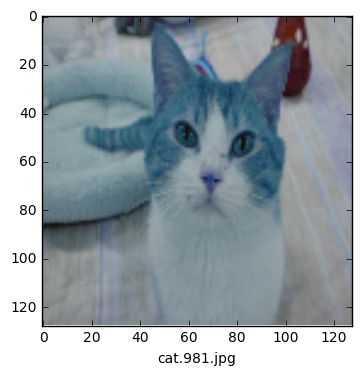

The train label is:  cat.981.jpg


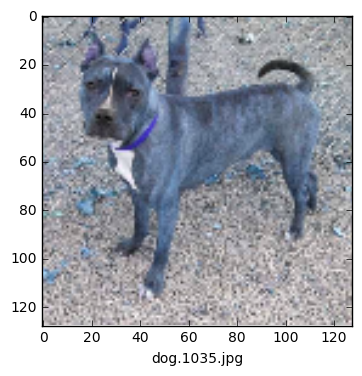

The train label is:  dog.1035.jpg


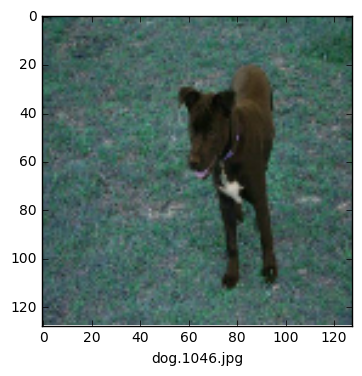

The train label is:  dog.1046.jpg


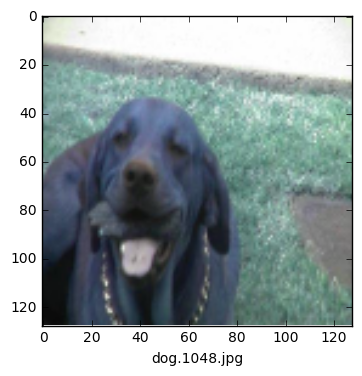

The train label is:  dog.1048.jpg


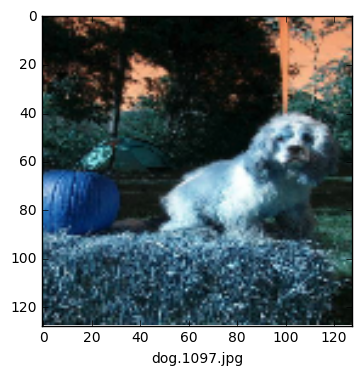

The train label is:  dog.1097.jpg


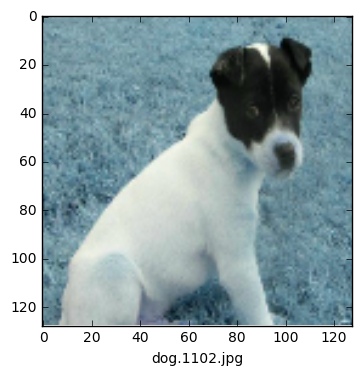

The train label is:  dog.1102.jpg


In [6]:
#Visualising some of the clean training clean Images
print("Total number of images: ",len(Train_imgs))
print("Matrix representation of 67th image: ",Train_imgs[67])


#Displaying 149th to 155th image from the training clean data
for i in range (149,155):
    plt.figure()
    plt.imshow(Train_imgs[i], cmap=plt.cm.binary)
    lable = Lables[i]
    plt.xlabel(lable)
        
    plt.show()    
    print("The train label is: ",Lables[i])

In [22]:
#Creating the noisy training data and splitting it into train and test
Noisy_Train_Data, Noisy_Lables, Noisy_Train_imgs = create_noisy_train_data()
print ("Shape of X_train_Noisy before reshaping: ",Noisy_Train_Data.shape)

#Reshaping the Data to fit into the Autoencoder model.
if num_channel==1:
    if K.image_dim_ordering()=='th':
        Noisy_Train_Data= np.expand_dims(Noisy_Train_Data, axis=1)
        #print (Noisy_Train_Data.shape)
    else:
        Noisy_Train_Data= np.expand_dims(Noisy_Train_Data, axis=4) 
        #print (Noisy_Train_Data.shape)       
else:
    if K.image_dim_ordering()=='th':
        Noisy_Train_Data=np.rollaxis(Noisy_Train_Data,3,1)
        #print (Noisy_Train_Data.shape)
        

X_train_Noisy, X_test_Noisy, y_train_Noisy, y_test_Noisy = train_test_split(Noisy_Train_Data, Noisy_Lables, test_size=0.2, random_state=2)

print("Shape of X_train_Noisy after reshaping and splitting: ",X_train_Noisy.shape)
print("Shape of X_test_Noisy after reshaping and splitting: ",X_test_Noisy.shape)

# Defining the model
input_shape=Train_Data[0].shape
print("Input shape of the encoder model: ", input_shape)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.11s/it]


Shape noise:  (300, 128, 128, 3)
Shape of X_train_Noisy before reshaping:  (300, 128, 128, 3)
Shape of X_train_Noisy after reshaping and splitting:  (240, 3, 128, 128)
Shape of X_test_Noisy after reshaping and splitting:  (60, 3, 128, 128)
Input shape of the encoder model:  (3, 128, 128)


Total number of images:  300
Matrix representation of 67th image:  [[[  1  42 124]
  [  7  53 126]
  [ 12   4 122]
  ...
  [  2   0  16]
  [ 17  14 119]
  [ 31  67 153]]

 [[ 31  31 143]
  [ 13   0 145]
  [ 38  68 142]
  ...
  [  0   0  11]
  [ 26  20 140]
  [ 37  30 156]]

 [[  8   0 151]
  [ 36  17 152]
  [ 29  48 145]
  ...
  [  1   0   7]
  [ 11 102 150]
  [ 68   1 163]]

 ...

 [[ 62   0 177]
  [  1  40 175]
  [  0   8 170]
  ...
  [ 35   0 189]
  [ 43   1 179]
  [117  16 177]]

 [[ 38  28 150]
  [ 42  42 155]
  [ 29   0 147]
  ...
  [ 78   1 185]
  [ 25  87 182]
  [  1  41 174]]

 [[ 60  10 154]
  [  1 114 158]
  [ 10   6 161]
  ...
  [ 18   1 173]
  [  1   1 174]
  [ 63  11 172]]]


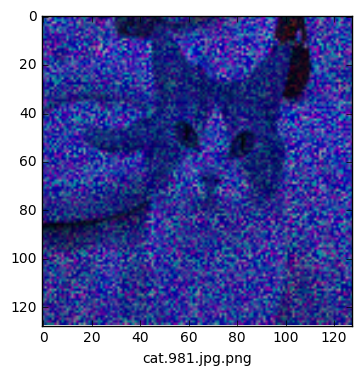

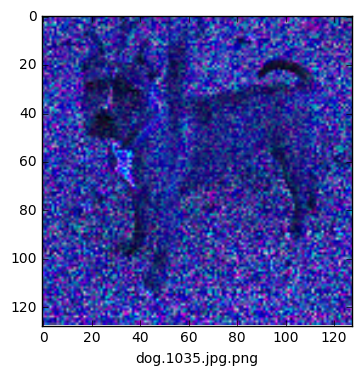

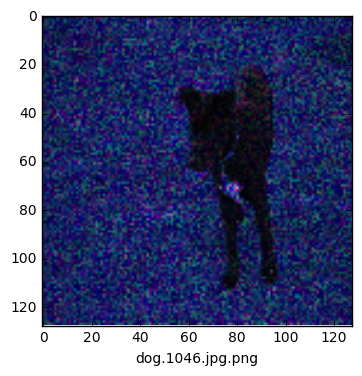

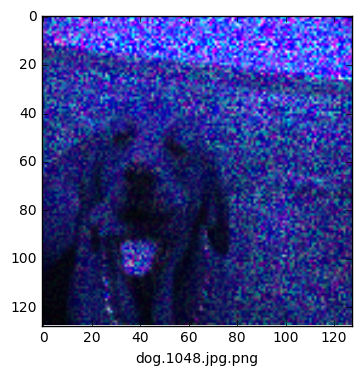

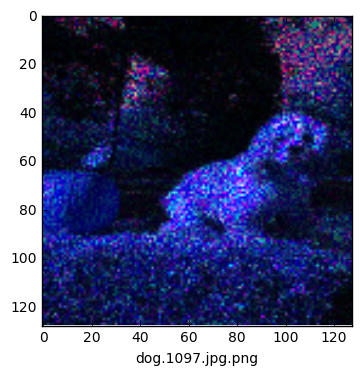

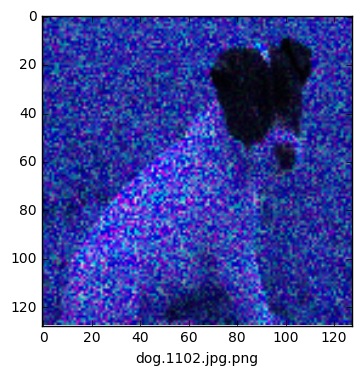

In [12]:
#Visualising some of the noisy training Images
print("Total number of images: ",len(Noisy_Train_imgs))
print("Matrix representation of 67th image: ",Noisy_Train_imgs[67])

#Displaying 149th to 155th image from the training noisy data
for i in range (149,155):
    plt.figure()
    plt.imshow(Noisy_Train_imgs[i], cmap=plt.cm.binary)
    lable = Noisy_Lables[i]
    plt.xlabel(lable)
        
    plt.show()    


In [17]:
#Creating the noisy data that is to be cleaned 
Noisy_Test_Data, Noisy_Test_Lables, Noisy_Test_imgs = create_noisy_test_data()
print ("Shape of X_val_Noisy before reshaping",Noisy_Test_Data.shape)

#Reshaping the Data to fit into the Autoencoder model.
if num_channel==1:
    if K.image_dim_ordering()=='th':
        Noisy_Test_Data= np.expand_dims(Noisy_Test_Data, axis=1)
        #print (Noisy_Test_Data.shape)
    else:
        Noisy_Test_Data= np.expand_dims(Noisy_Test_Data, axis=4) 
        #print (Noisy_Test_Data.shape)       
else:
    if K.image_dim_ordering()=='th':
        Noisy_Test_Data=np.rollaxis(Noisy_Test_Data,3,1)
        #print (Noisy_Test_Data.shape)
        
Train_Data, Lables
X_val_Noisy, y_val_Noisy = (Noisy_Test_Data, Noisy_Test_Lables) 

print("Shape of X_val_Noisy after reshaping",X_val_Noisy.shape)
print("Number os lables: ", len(y_val_Noisy))



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  3.49it/s]


Shape noise:  (150, 128, 128, 3)
Shape of X_val_Noisy before reshaping (150, 128, 128, 3)
Shape of X_val_Noisy after reshaping (150, 3, 128, 128)
Number os lables:  150


150
[[[ 25  34 118]
  [ 25  54 120]
  [ 12  25  86]
  ...
  [  2   7  29]
  [ 10  12  32]
  [ 15  19  31]]

 [[  7  10 102]
  [ 31  53 123]
  [ 15  41 103]
  ...
  [ 14   7  29]
  [  7   7  30]
  [ 10   8  23]]

 [[ 27  46 118]
  [ 34  61 117]
  [ 29  45 137]
  ...
  [ 16  19  42]
  [ 12  14  36]
  [ 21  15  35]]

 ...

 [[  3   2  10]
  [  3   2   7]
  [  2   1  10]
  ...
  [  3   5  16]
  [  2   6  17]
  [ 17  12  24]]

 [[  6   4  10]
  [ 10   6  12]
  [  6   5  11]
  ...
  [  8   1  18]
  [  9   5  19]
  [  9   3  15]]

 [[ 12   8  13]
  [  6   3   8]
  [  6   3   8]
  ...
  [ 12  14  20]
  [  5   9  19]
  [  8   3  12]]]


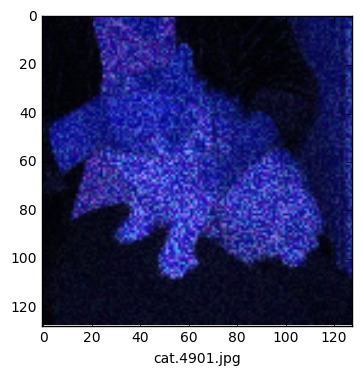

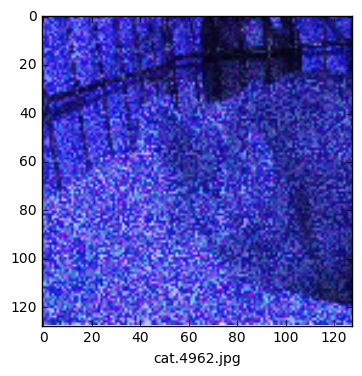

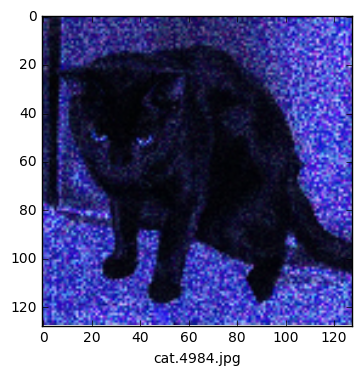

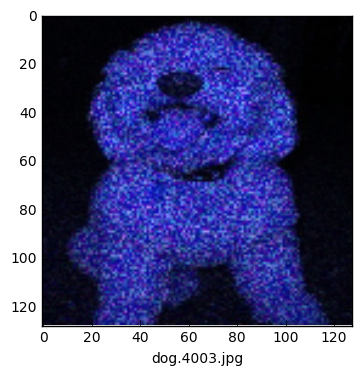

In [25]:
#Visualising some of the noisy input Images to be cleaned
print(len(Noisy_Test_imgs))
print(Noisy_Test_imgs[67])

for i in range (72,76):
    plt.figure()
    plt.imshow(Noisy_Test_imgs[i], cmap=plt.cm.binary)
    lable = Noisy_Test_Lables[i]
    plt.xlabel(lable)
        
    plt.show()    


In [27]:
#The Model Definaion

input_img = Input(input_shape)  # adapt this if using `channels_first` image data format
x = Conv2D(10, (5, 5), activation='tanh', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(20, (2, 2), activation='tanh', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
encoded = x

x = UpSampling2D((2, 2))(x)
x = Conv2DTranspose(20, (2, 2), activation='tanh', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2DTranspose(10, (5, 5), activation='tanh', padding='same')(x)
x = Conv2D(10, (5, 5), activation='tanh', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2DTranspose(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)
autoencoder.summary()
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=["accuracy"])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 3, 128, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 10, 128, 128)      760       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 10, 64, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 20, 64, 64)        820       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 20, 32, 32)        0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 20, 32, 32)        1620      
_________________________________________________________________
up_sampling2d_5 (UpSampling2 (None, 20, 64, 64)        0         
__________

In [88]:
#####################Training the model with noisy test image###########################
print("Training")
filename='DenoiseImg_Sigmoid_model_train.csv'
csv_log=callbacks.CSVLogger(filename, separator=',', append=False)

early_stopping=callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=100, verbose=0, mode='min')

filepath="DenoiseImg-Sigmoid-Best-weights-my_model-{epoch:03d}-{loss:.4f}-{acc:.4f}.hdf5"

checkpoint = callbacks.ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

callbacks_list = [csv_log,early_stopping,checkpoint]

Training


In [89]:
#Training the Model
hist = autoencoder.fit(X_train_Noisy, X_train,
                epochs=num_epoch,
                verbose=1,
                batch_size=25,
                shuffle=True,
                validation_data=(X_test_Noisy, X_test),
                callbacks=callbacks_list)

Train on 240 samples, validate on 60 samples
Epoch 1/100
240/240 [==============================] - 9s 39ms/step - loss: 0.6888 - acc: 0.0082 - val_loss: 0.7080 - val_acc: 0.0024

Epoch 00001: val_loss improved from inf to 0.70799, saving model to DenoiseImg-Sigmoid-Best-weights-my_model-001-0.6888-0.0082.hdf5
Epoch 2/100
240/240 [==============================] - 9s 36ms/step - loss: 0.6780 - acc: 0.0100 - val_loss: 0.6432 - val_acc: 0.0030

Epoch 00002: val_loss improved from 0.70799 to 0.64323, saving model to DenoiseImg-Sigmoid-Best-weights-my_model-002-0.6780-0.0100.hdf5
Epoch 3/100
240/240 [==============================] - 9s 37ms/step - loss: 0.6440 - acc: 0.0115 - val_loss: 0.6029 - val_acc: 0.0030

Epoch 00003: val_loss improved from 0.64323 to 0.60287, saving model to DenoiseImg-Sigmoid-Best-weights-my_model-003-0.6440-0.0115.hdf5
Epoch 4/100
240/240 [==============================] - 9s 36ms/step - loss: 0.6179 - acc: 0.0113 - val_loss: 0.6288 - val_acc: 0.0029

Epoch 00004

In [90]:
#Sample Prediction with the input noisy image to be cleaned
testSample = X_val_Noisy[60]
print(testSample.shape)
test_predict = autoencoder.predict(np.array([testSample]))[0]

(3, 128, 128)


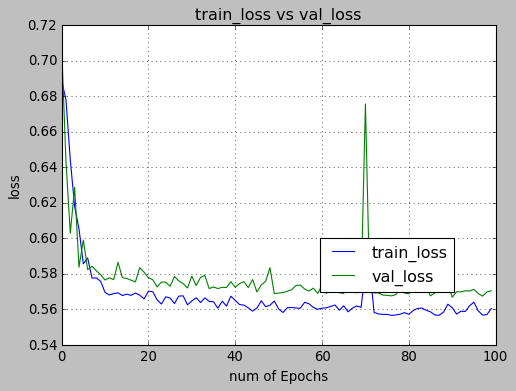

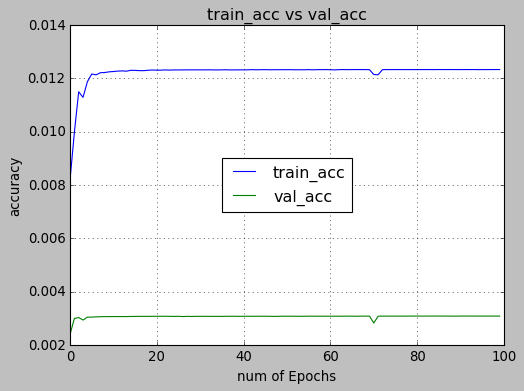

In [91]:
# visualizing losses and accuracy
train_loss=hist.history['loss']
val_loss=hist.history['val_loss']
train_acc=hist.history['acc']
val_acc=hist.history['val_acc']

xc=range(num_epoch)

plt.figure(1,figsize=(7,5))
plt.plot(xc,train_loss)
plt.plot(xc,val_loss)

plt.xlabel('num of Epochs')
plt.ylabel('loss')
plt.title('train_loss vs val_loss')
plt.grid(True)
plt.legend(['train_loss','val_loss'], loc=10, bbox_to_anchor=(0.5, 0., 0.5, 0.5))
#print plt.style.available # use bmh, classic,ggplot for big pictures
plt.style.use(['classic'])


plt.figure(2,figsize=(7,5))
plt.plot(xc,train_acc)
plt.plot(xc,val_acc)
plt.xlabel('num of Epochs')
plt.ylabel('accuracy')
plt.title('train_acc vs val_acc')
plt.grid(True)
plt.legend(['train_acc','val_acc'],loc=10)
#print plt.style.available # use bmh, classic,ggplot for big pictures
plt.style.use(['classic'])

plt.show()

In [92]:
#Converting the noisy input and clean output into their old form to be displayed
print(testSample.shape)
testSample = np.array((testSample * 255 )[0], dtype=np.uint8)
img = Image.fromarray(testSample)

test_predict = np.array((test_predict * 255 )[0], dtype=np.uint8)
Noise_img = Image.fromarray(test_predict)



(3, 128, 128)


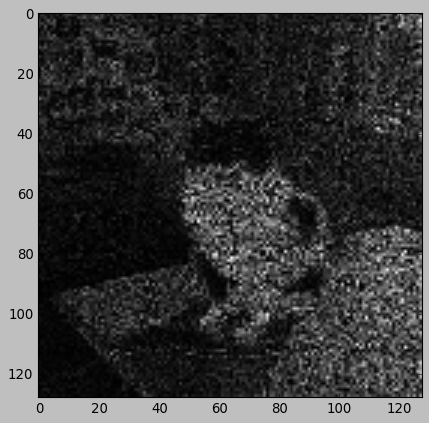

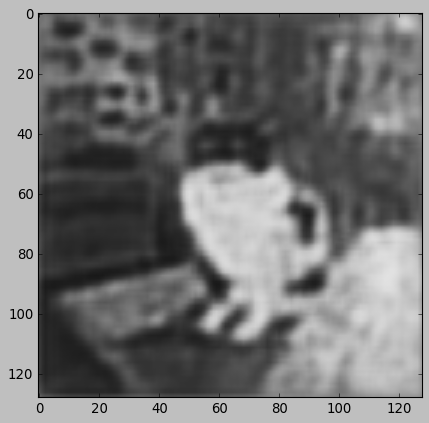

In [93]:
#Comparing the noisy input with the clean Output
plt.figure()
plt.imshow(img, cmap=plt.cm.binary)        
plt.show()    


plt.figure()
plt.imshow(Noise_img, cmap=plt.cm.binary)        
plt.show()

In [84]:
#cleaning all the noisy images using the trained model and storing them in a list along with their respective labels
CleanPictures = []
CleanPictureArray = []
Lables_list = []

for i in range(len(X_val_Noisy)):
    Val_Sample = X_val_Noisy[i]
    Val_predict = autoencoder.predict(np.array([Val_Sample]))[0]
    
    Val_predict = np.array((Val_predict * 255 )[0], dtype=np.uint8)
    Clean_img = Image.fromarray(Val_predict)
    CleanPictures.append(Clean_img)
    CleanPictureArray.append(Val_predict)

for lbl in y_val_Noisy:
    Lables_list.append(lbl)
    

In [28]:
#print("Number of images cleaned: "len(CleanPictures))
#print(len(CleanPictureArray))
#print(len(Lables_list))

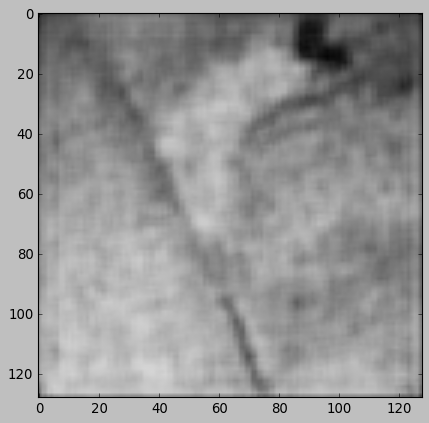

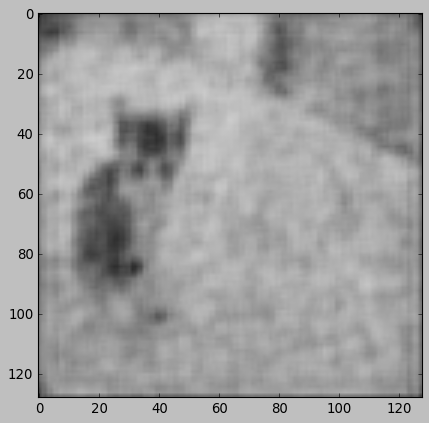

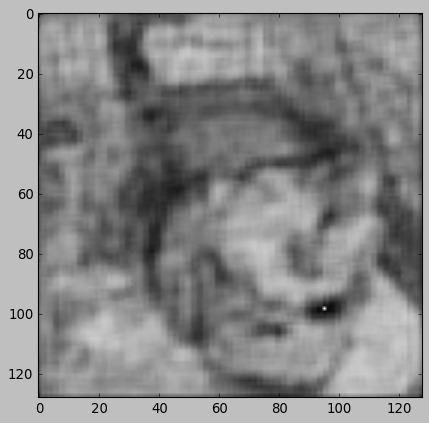

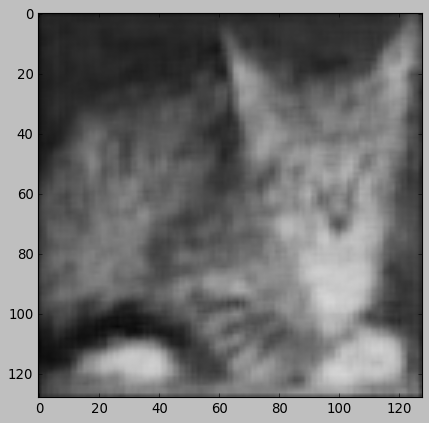

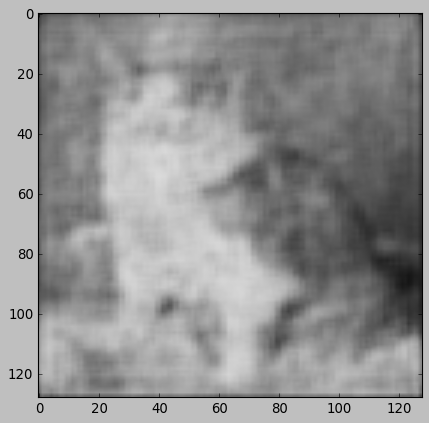

...

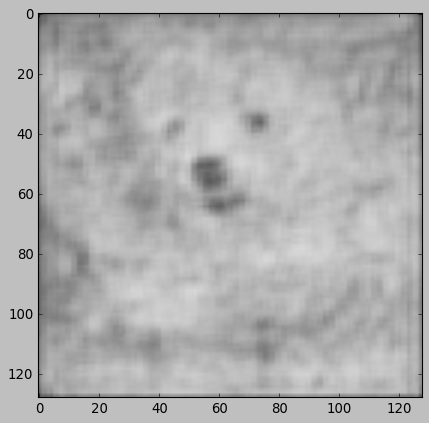

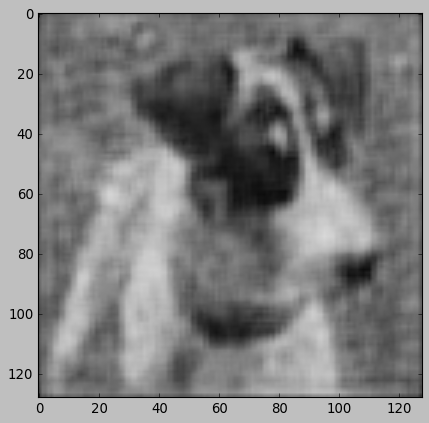

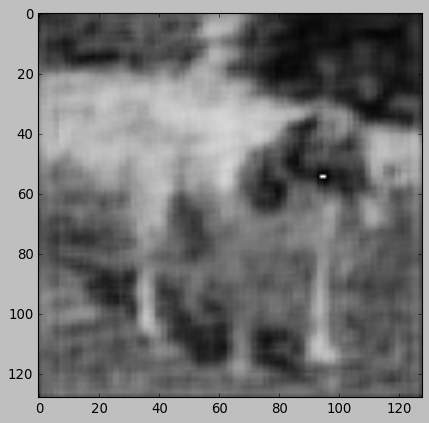

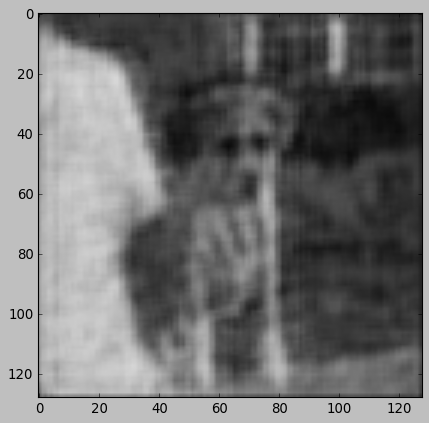

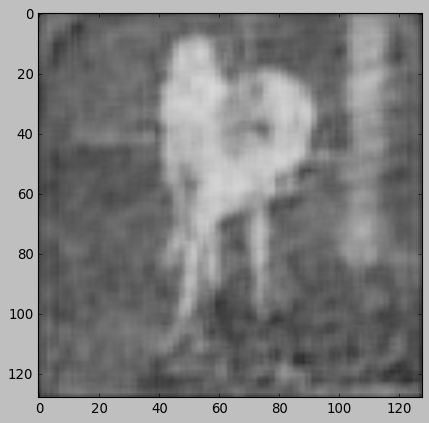

In [86]:
#Writting the output to a file
path = "C:/Users/Sumit Kundu/Image Classification using CNN/dataset/Cleaned_MIX/"
for i in range (len(CleanPictures)):
    plt.figure()
    plt.imshow(CleanPictures[i], cmap=plt.cm.binary)
    plt.show()
    cv2.imwrite(str(path)+ str(Lables_list[i]),CleanPictureArray[i])